<a href="https://colab.research.google.com/github/raisulromel/lively_matrix/blob/master/Yolov11_(_On_Grayscale).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 911.6/911.6 kB 22.8 MB/s eta 0:00:00


### calling annotated images from roboflow using api

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="1zCdp9KjvmD2P7CYVebE")
project = rf.workspace("romels-lab").project("real-vs-ai-nlh9j")
version = project.version(4)
dataset = version.download("yolov11")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.5/81.5 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.4 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Real-vs-AI-4 in yolov11:: 100%|██████████| 364/364 [00:00<00:00, 4963.62it/s]


### training on "yolov11n.pt" pre trained from github -- epochs = 80

In [ ]:
!yolo detect train data=/content/Real-vs-AI-4/data.yaml model=yolo11n.pt epochs=100 imgsz=640

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
100% 5.35M/5.35M [00:00<00:00, 99.6MB/s]
Ultralytics 8.3.65 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/Real-vs-AI-4/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, 

#### phew bhalo results ashche 😀

### Showing results images on colab

In [ ]:
from IPython.display import Image

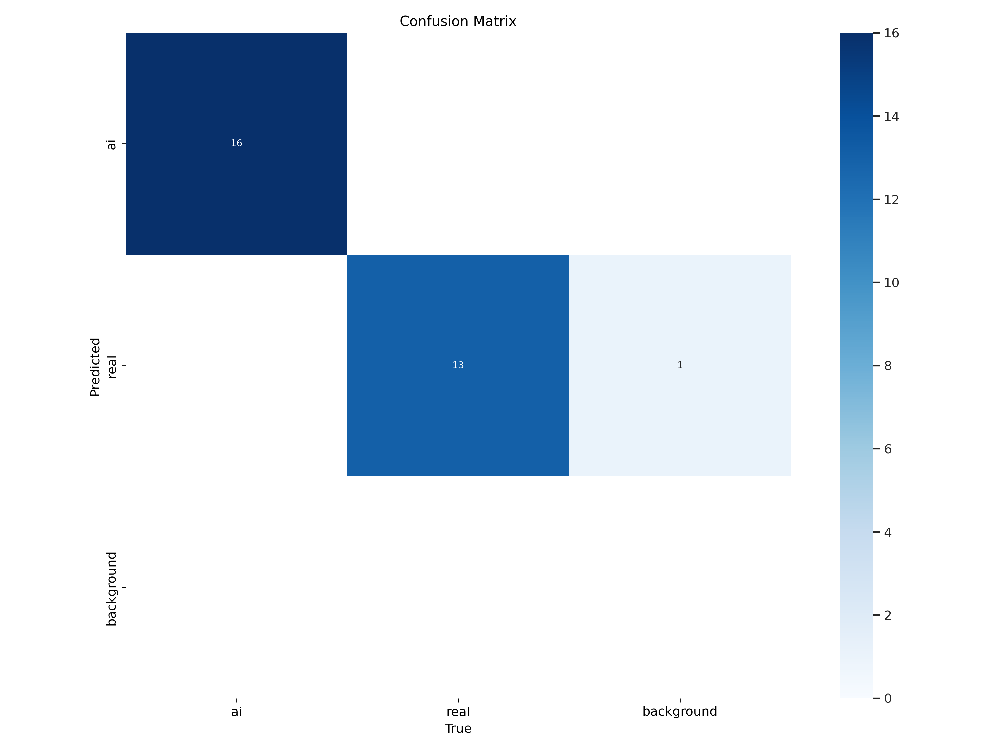

In [ ]:
Image('/content/runs/detect/train/confusion_matrix.png', width=600)

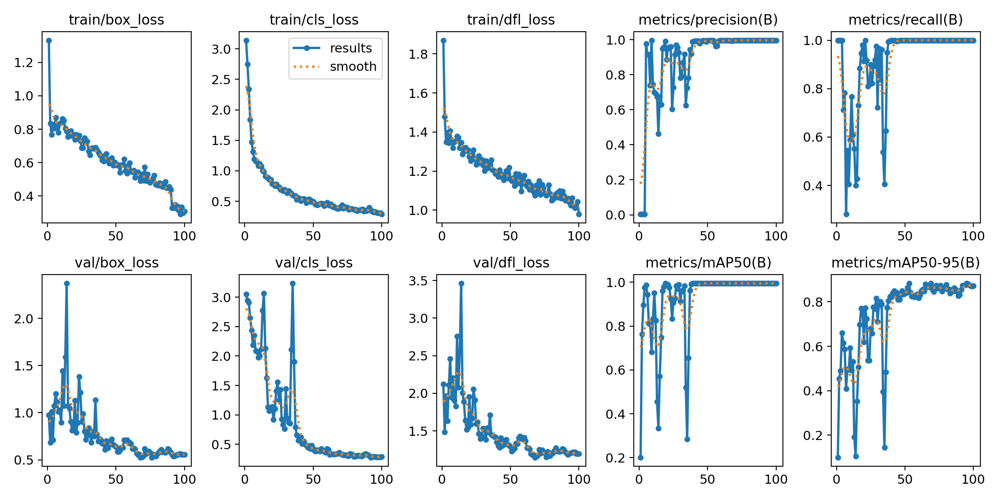

In [ ]:
Image('/content/runs/detect/train/results.png', width=640)

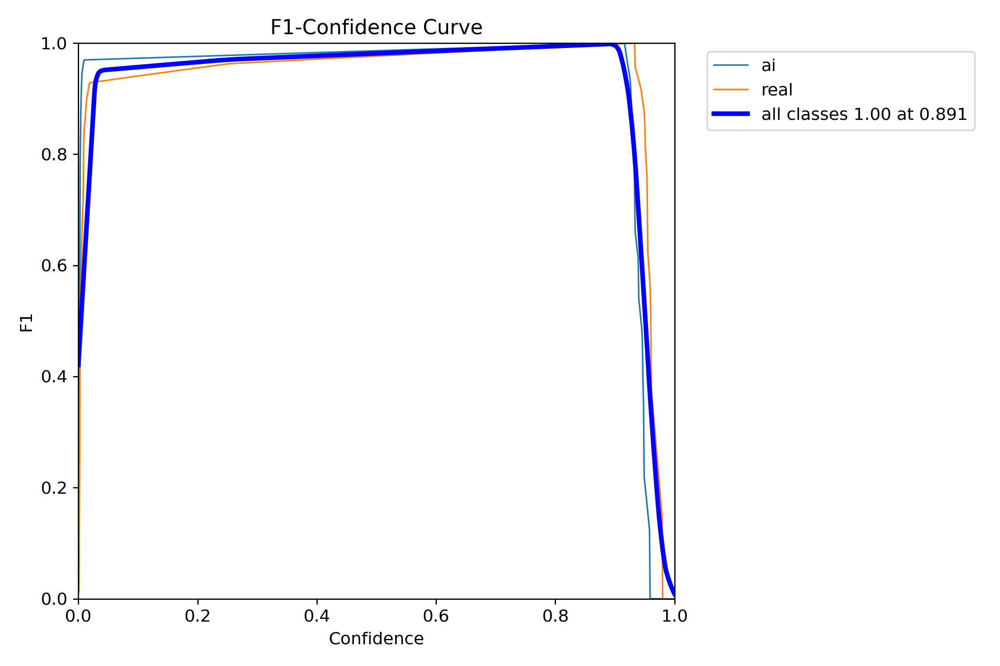

In [ ]:
Image('/content/runs/detect/train/F1_curve.png', width=640)

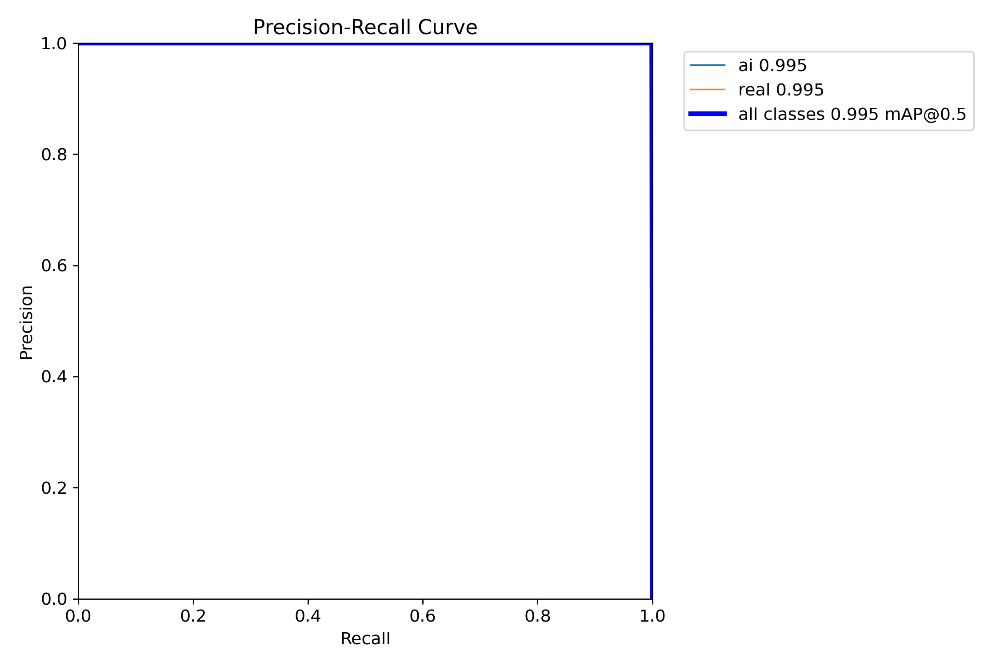

In [ ]:
Image('/content/runs/detect/train/PR_curve.png', width=640)

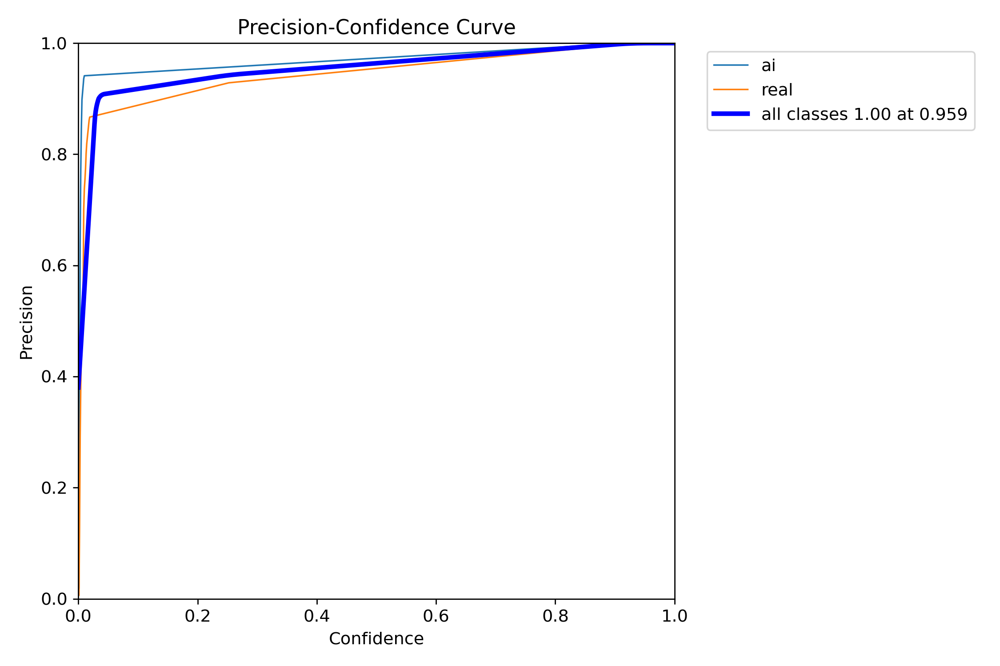

In [ ]:
Image('/content/runs/detect/train/P_curve.png', width=640)

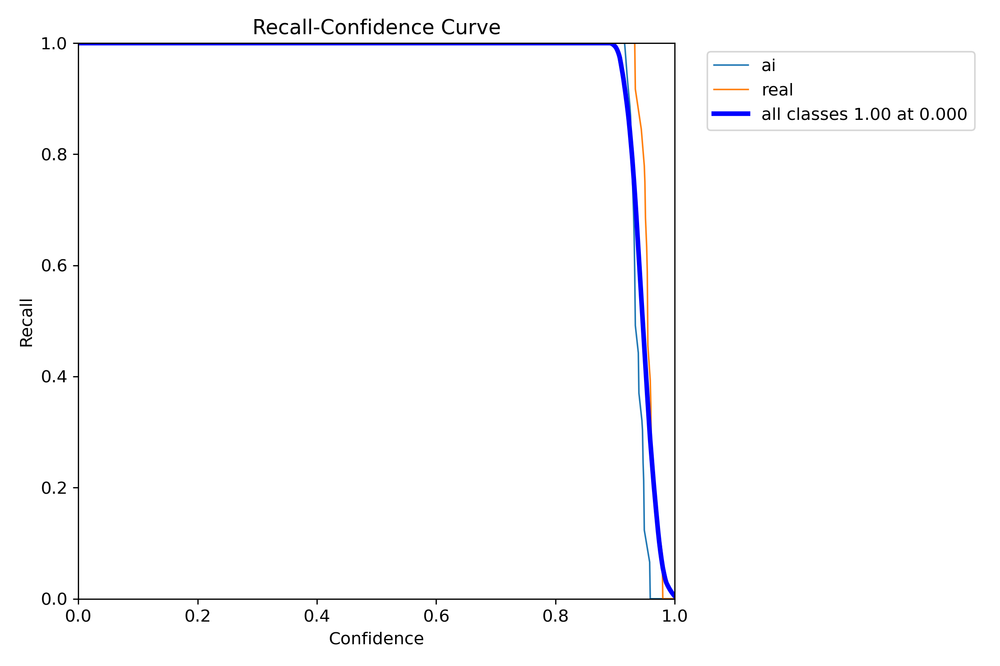

In [ ]:
Image('/content/runs/detect/train/R_curve.png', width=640)

### validation images **labeled** and **detected** by the **model**

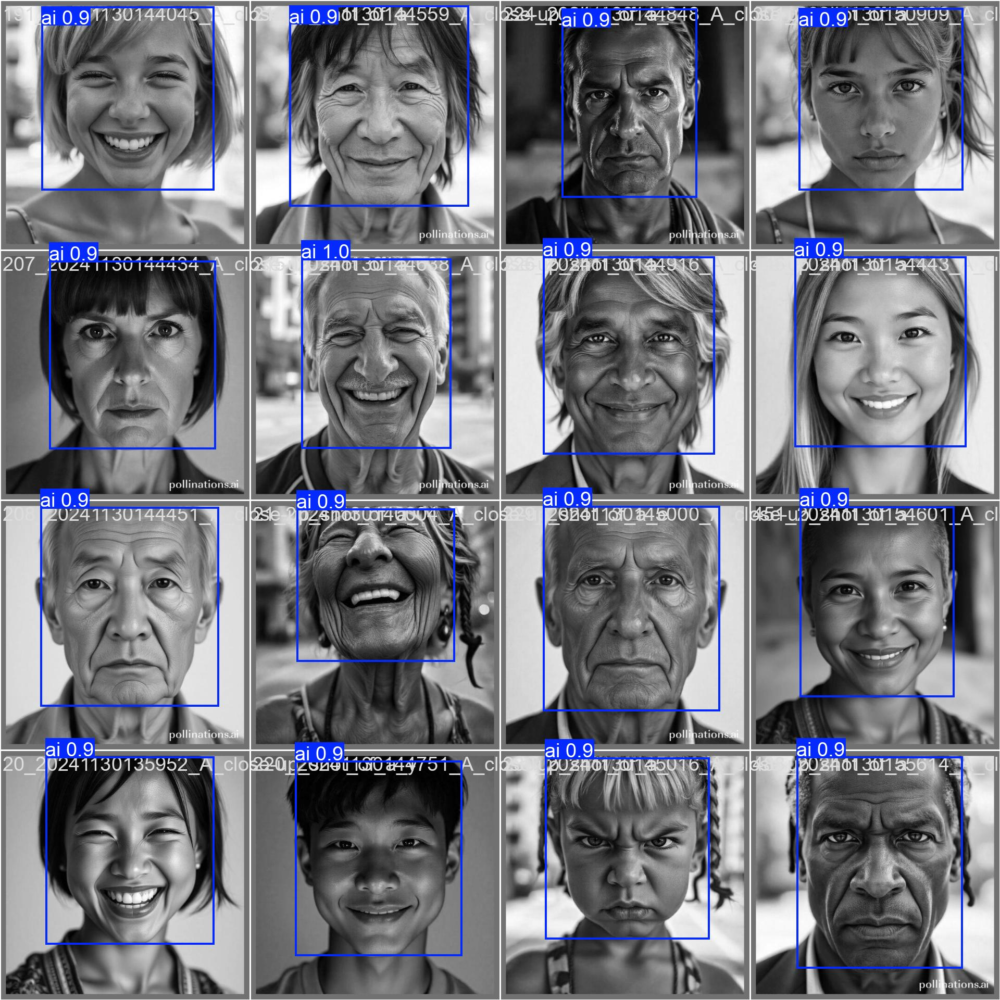

In [ ]:
Image('/content/runs/detect/train/val_batch0_pred.jpg', width=640)

validation images labeled by me.

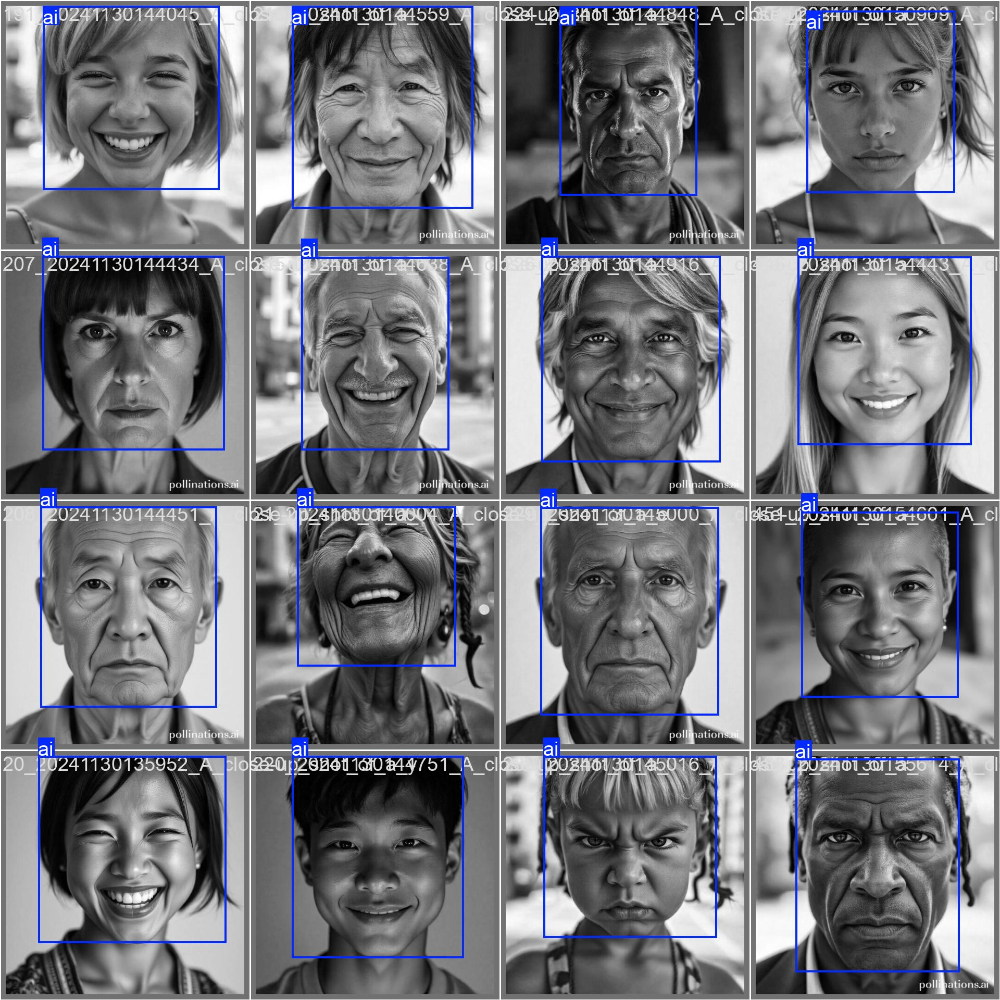

In [ ]:
Image('/content/runs/detect/train/val_batch0_labels.jpg', width=640)

### image test and prediction on trained model taking best.pt

In [ ]:
!yolo detect predict model=/content/runs/detect/train/weights/best.pt source=/content/Real-vs-AI-4/test/images save=True

Ultralytics 8.3.65 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs

image 1/12 /content/Real-vs-AI-4/test/images/462_20241130154918_A_close-up_shot_of_a_young_adult_non-binary_person_jpg.rf.6914dadcb5a3114b8bf73808992e5e04.jpg: 640x640 1 ai, 10.6ms
image 2/12 /content/Real-vs-AI-4/test/images/574_20241130161922_A_close-up_shot_of_a_middle-aged_female_person_of__jpg.rf.c4ba42041b095f9a83f838d086f02373.jpg: 640x640 1 ai, 8.3ms
image 3/12 /content/Real-vs-AI-4/test/images/child-1486_png.rf.fba2ffb301e1287d1301a1840b2e5f4a.jpg: 640x640 1 real, 8.6ms
image 4/12 /content/Real-vs-AI-4/test/images/child-1494_png.rf.9adc565f7023b2bb2ac6a71ab2e0b0fa.jpg: 640x640 1 real, 7.8ms
image 5/12 /content/Real-vs-AI-4/test/images/child-1739_png.rf.1d112ae0f7edd0f87d24f7e2deddfd23.jpg: 640x640 1 real, 7.8ms
image 6/12 /content/Real-vs-AI-4/test/images/child-1764_png.rf.3229091c6903adf13f83813372f6306c.jpg: 640

### Prediction by our trained model(on our test images)

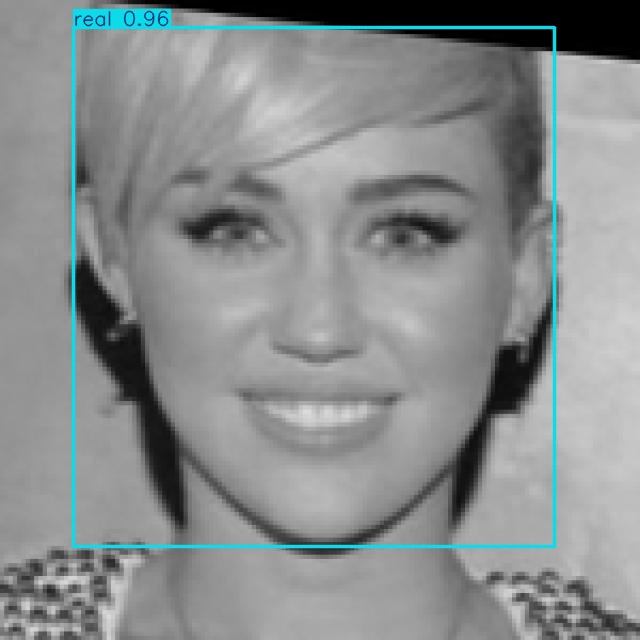

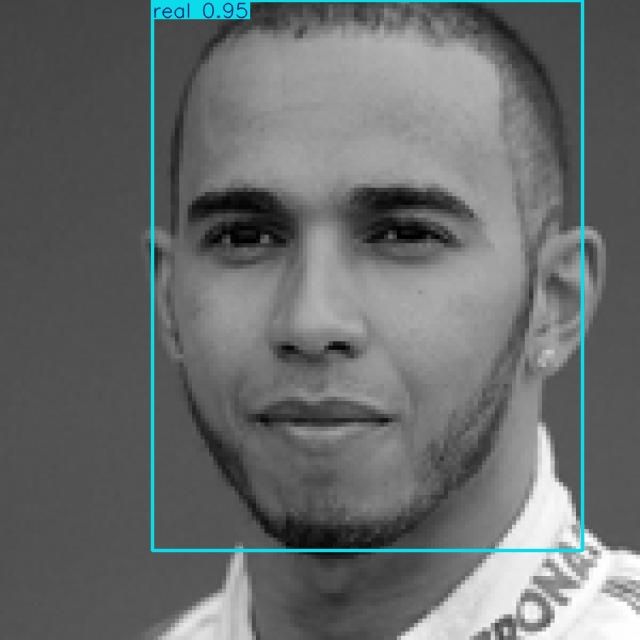

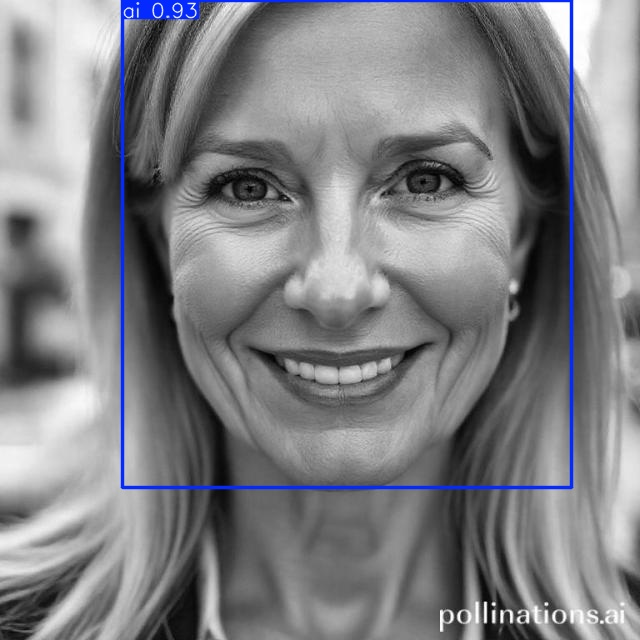

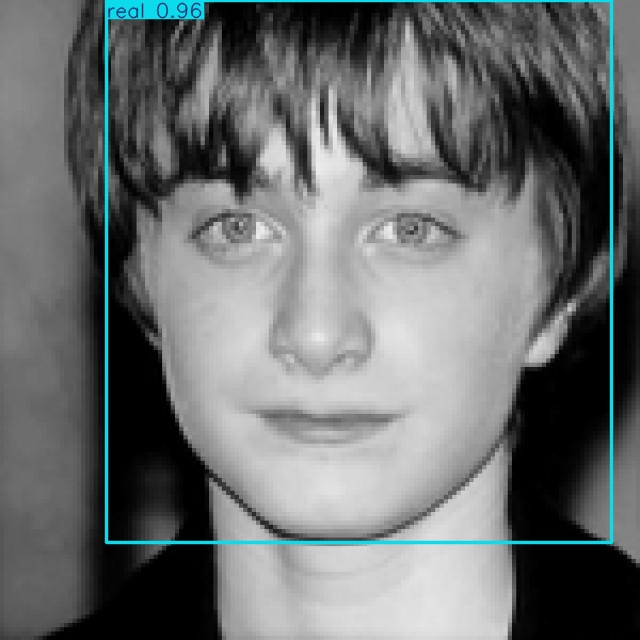

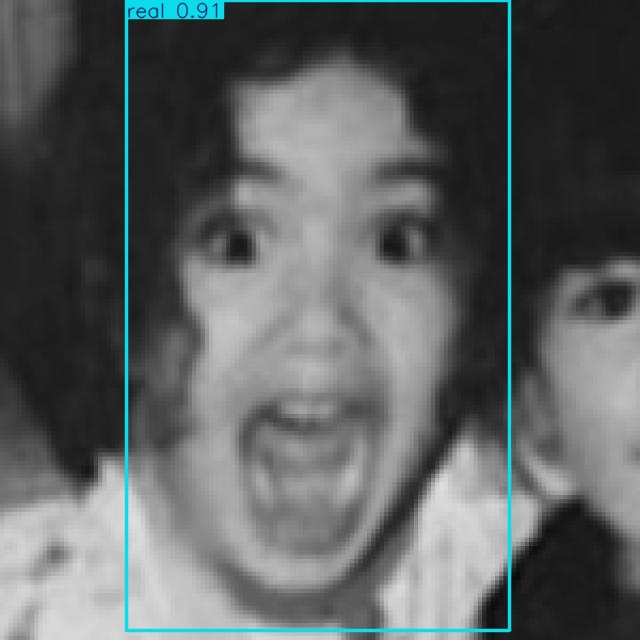

...

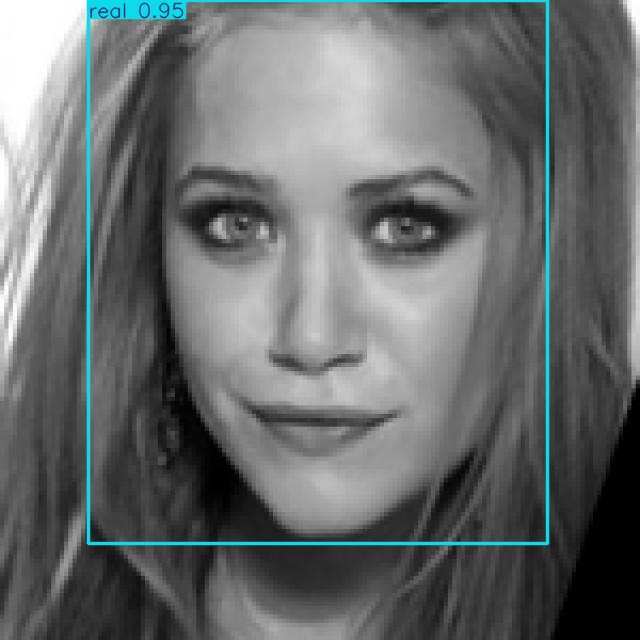

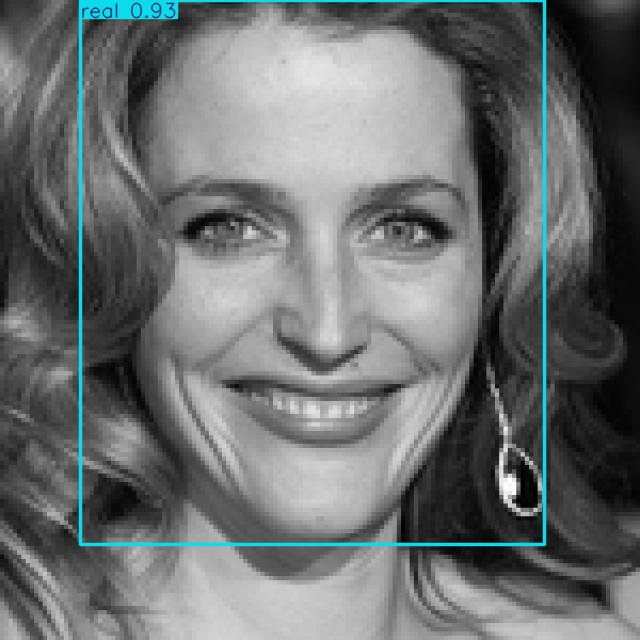

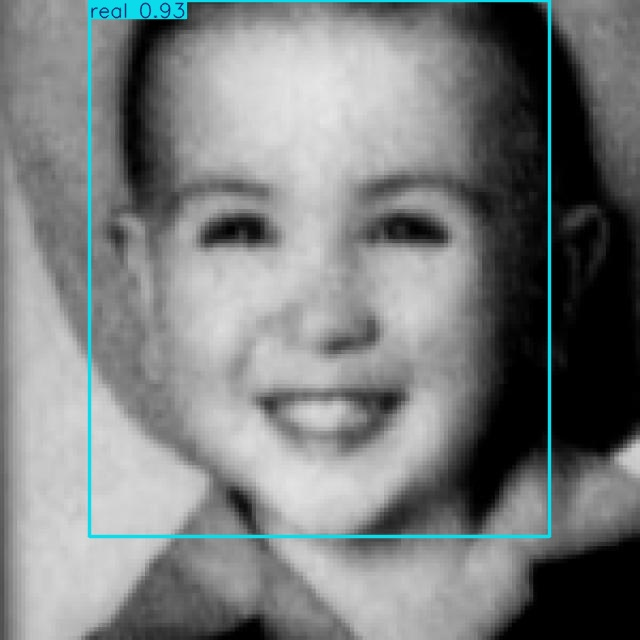

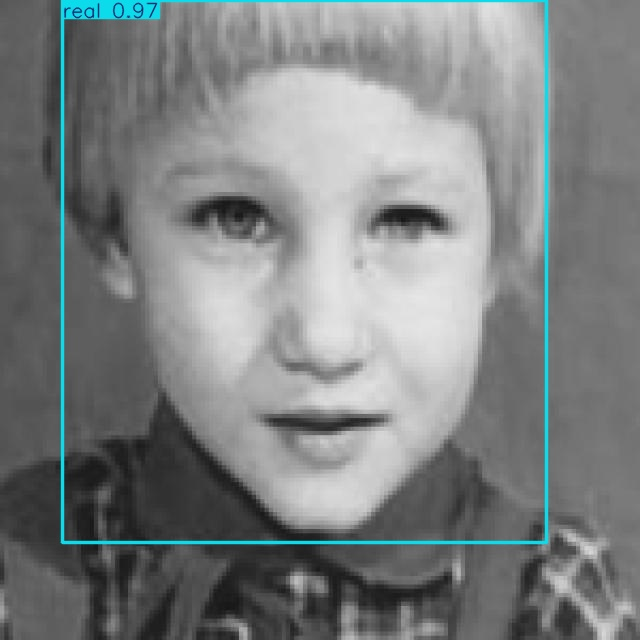

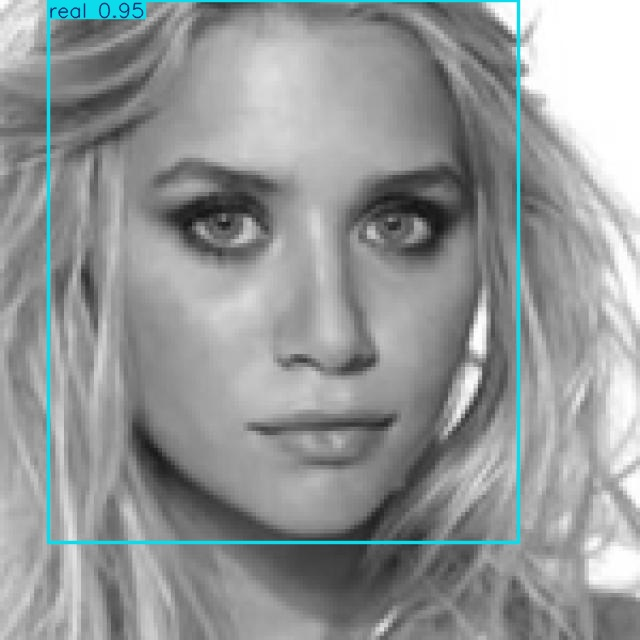

In [ ]:
import glob
images = glob.glob('/content/runs/detect/predict/*.jpg')
for image in images:
  display(Image(filename=image, width=600))

### more test(on ***91 images***)

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train/weights/best.pt")

results = model("/content/Real-vs-AI-4/test images", save=True)


image 1/91 /content/Real-vs-AI-4/test images/389_20241130152907_A_close-up_shot_of_a_child_non-binary_person_of_Mi.jpg: 640x640 1 ai, 8.0ms
image 2/91 /content/Real-vs-AI-4/test images/390_20241130152925_A_close-up_shot_of_a_young_adult_female_person_of_.jpg: 640x640 1 ai, 8.8ms
image 3/91 /content/Real-vs-AI-4/test images/391_20241130152941_A_close-up_shot_of_a_middle-aged_female_person_of_.jpg: 640x640 1 ai, 7.8ms
image 4/91 /content/Real-vs-AI-4/test images/392_20241130153001_A_close-up_shot_of_a_child_female_person_of_Native.jpg: 640x640 1 ai, 8.0ms
image 5/91 /content/Real-vs-AI-4/test images/393_20241130153014_A_close-up_shot_of_a_young_adult_genderqueer_perso.jpg: 640x640 1 ai, 7.8ms
image 6/91 /content/Real-vs-AI-4/test images/394_20241130153029_A_close-up_shot_of_a_child_male_person_of_African_.jpg: 640x640 1 ai, 7.8ms
image 7/91 /content/Real-vs-AI-4/test images/395_20241130153059_A_close-up_shot_of_a_teenager_female_person_of_Mid.jpg: 640x640 1 ai, 7.8ms
image 8/91 /content

### expand the output section to see the predicted results


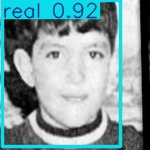

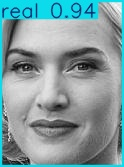

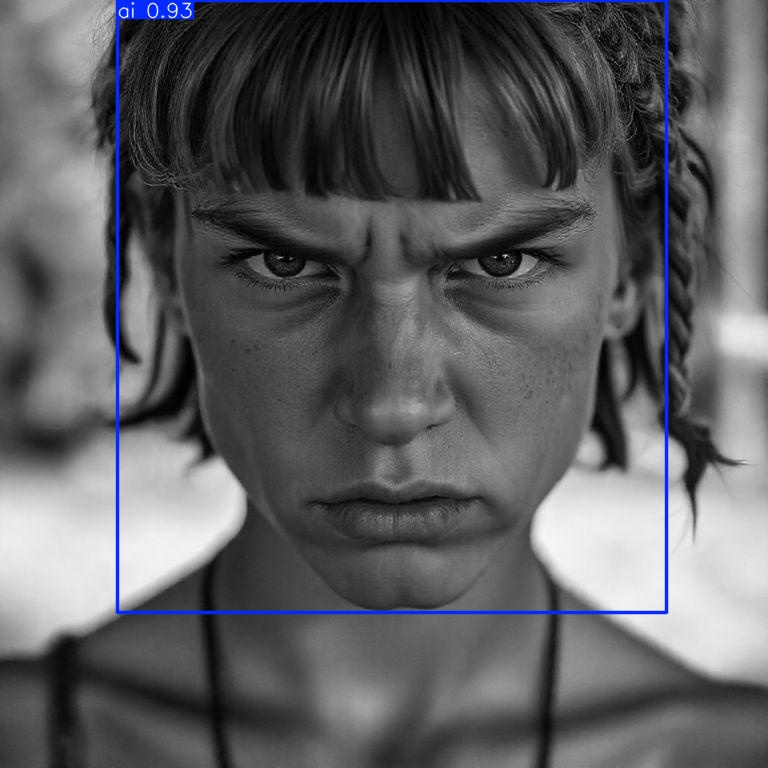

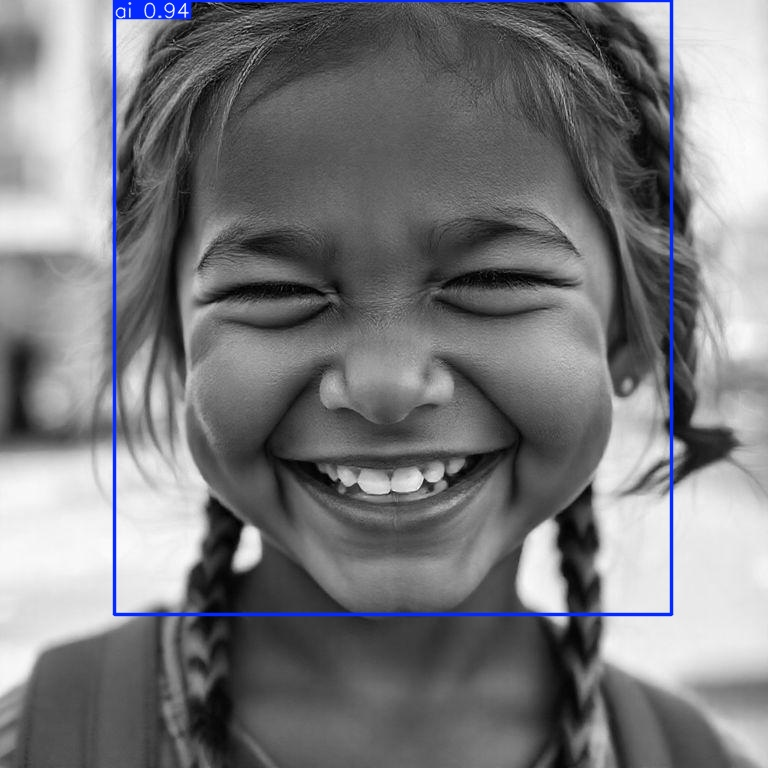

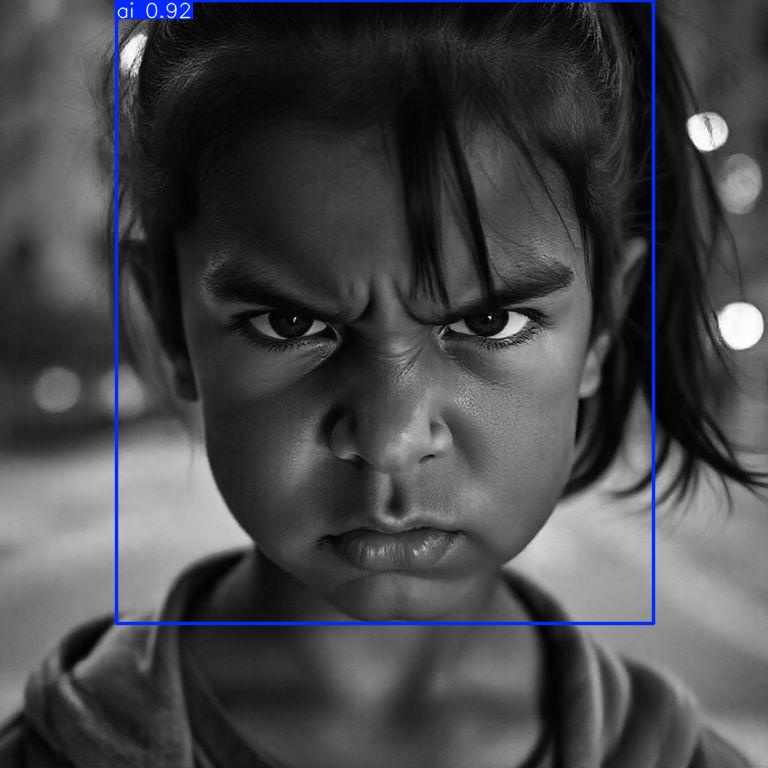

...

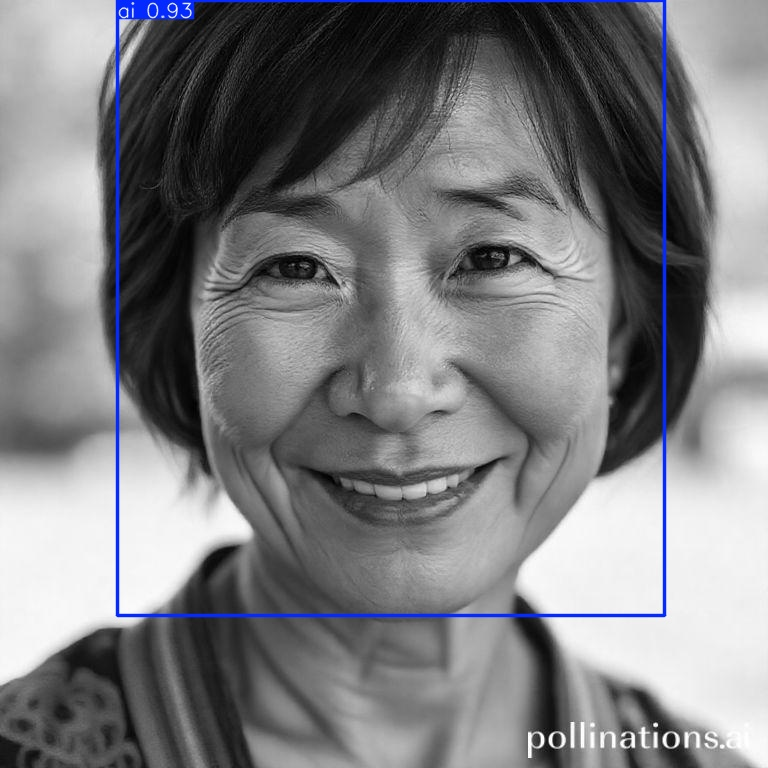

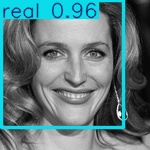

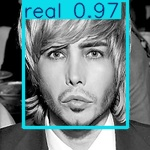

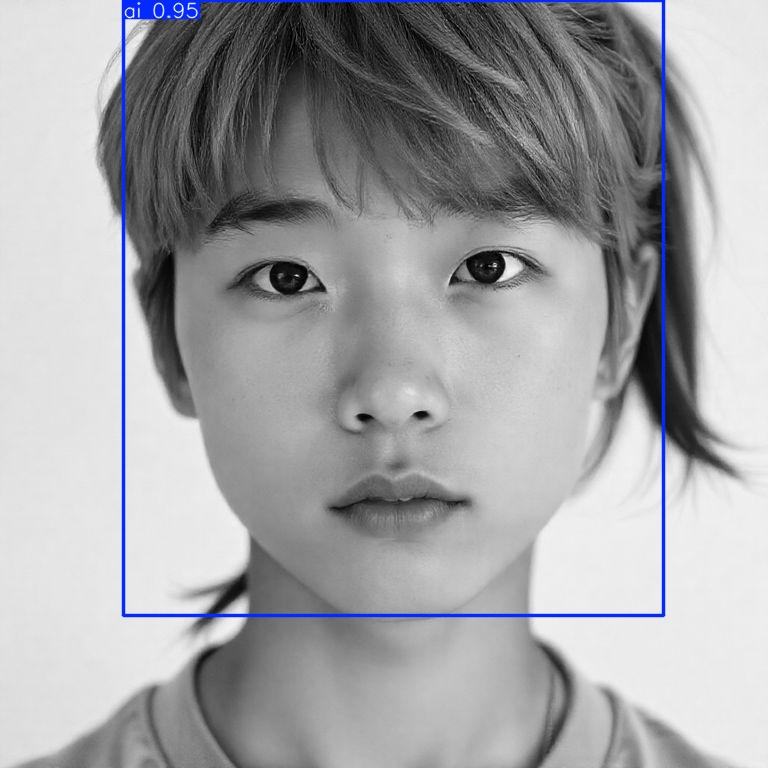

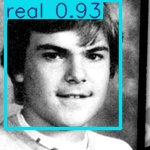

In [ ]:
import glob
images = glob.glob('/content/runs/detect/predict2/*.jpg')
for image in images:
  display(Image(filename=image, width=600))

## predicted every images with very good accuracy 😃

#**ignore the rest**

In [ ]:
!mkdir /content/my_model
!cp /content/runs/detect/train/weights/best.pt /content/my_model.pt
!cp -r /content/runs /content/my_model


mkdir: cannot create directory ‘/content/my_model’: File exists


In [ ]:
!zip /content/my_model1.zip
!zip -r /content/my_model1.zip /content/my_model
%cd /content


zip error: Nothing to do! (/content/my_model1.zip)
  adding: content/my_model/ (stored 0%)
  adding: content/my_model/runs/ (stored 0%)
  adding: content/my_model/runs/detect/ (stored 0%)
  adding: content/my_model/runs/detect/train/ (stored 0%)
  adding: content/my_model/runs/detect/train/R_curve.png (deflated 20%)
  adding: content/my_model/runs/detect/train/val_batch0_pred.jpg (deflated 10%)
  adding: content/my_model/runs/detect/train/PR_curve.png (deflated 29%)
  adding: content/my_model/runs/detect/train/train_batch1.jpg (deflated 5%)
  adding: content/my_model/runs/detect/train/confusion_matrix.png (deflated 41%)
  adding: content/my_model/runs/detect/train/labels.jpg (deflated 52%)
  adding: content/my_model/runs/detect/train/args.yaml (deflated 52%)
  adding: content/my_model/runs/detect/train/results.csv (deflated 63%)
  adding: content/my_model/runs/detect/train/F1_curve.png (deflated 16%)
  adding: content/my_model/runs/detect/train/val_batch0_labels.jpg (deflated 11%)
  a

## downloading results in a zip file

In [ ]:
from google.colab import files

files.download('/content/my_model1.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>